# **GLOBAL LANDSLIDE CATALOG EXPORT DATA RECORDED BY NASA !!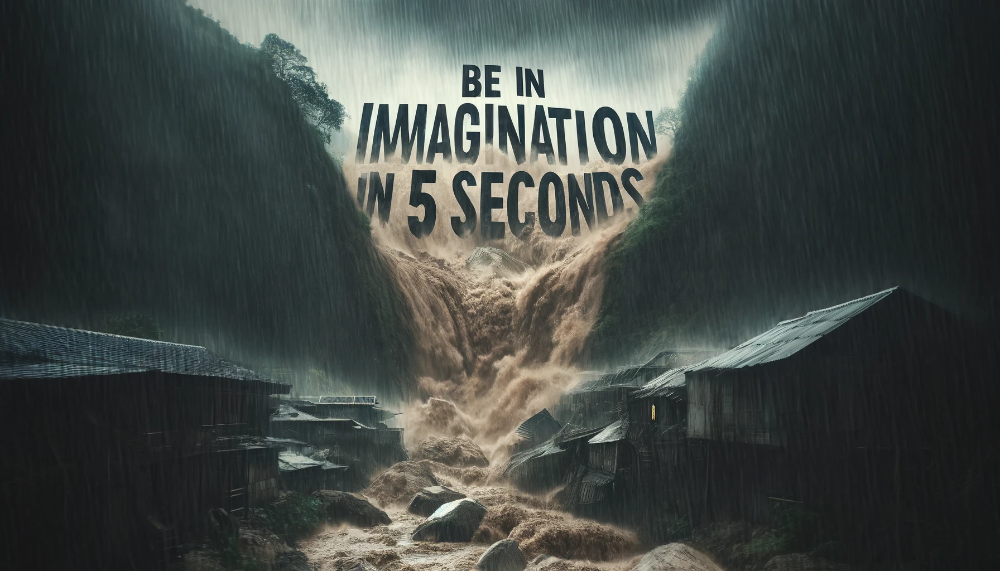**

*The above image is generated by AI*

---

**Introduction:**
 My objective in project 2 is to demonstrate proficiency in utilizing data analysis techniques, this project requires formulating hypotheses that dive deeper into every detail of data. The chosen dataset, in this case is the global landslide dataset, which inherently shapes the scope of project requirements.

**Data Source:**

I am curious to work on real time satellite data as I have a dream project of Space debris management. So, I explored astronomy, space science and satellite recorded related datasets for Machine learning modelling. I used this search term "satellite recorded climate data" while exploring and found dataset of meteor landings on earth in https://data.gov/. I am choosing this dataset for formulation of hypothesis from the data.



**Dataset links:**

https://catalog.data.gov/dataset/global-landslide-catalog-export

https://catalog.data.gov/dataset/global-landslide-catalog-export/resource/e9aad2b3-4ac1-443f-a6a8-e2e56a18babc



**Basic information about the data:**

The Global Landslide Catalog (GLC) was developed with the goal of identifying rainfall-triggered landslide events around the world, regardless of size, impacts or location. The GLC considers all types of mass movements triggered by rainfall, which have been reported in the media, disaster databases, scientific reports, or other sources. The GLC has been compiled since 2007 at NASA Goddard Space Flight Center. This is a unique data set with the ID tag “GLC” in the landslide editor.



As mentioned in the website, I am providing the citations of the dataset



**Citations**: Kirschbaum, D. B., Adler, R., Hong, Y., Hill, S., & Lerner-Lam, A. (2010). A global landslide catalog for hazard applications: method, results, and limitations. Natural Hazards, 52(3), 561–575. doi:10.1007/s11069-009-9401-4. [1] Kirschbaum, D.B., T. Stanley, Y. Zhou (In press, 2015). Spatial and Temporal Analysis of a Global Landslide Catalog. Geomorphology. doi:10.1016/j.geomorph.2015.03.016. [2]



This dataset does not have any license as it is supposed for public use and research and it is a free source to download. This data is legal to access as it is posted in public datasets sources for research and practice. The data which is being used will not be violating terms of service.



**About dataset**: This dataset provides detailed information of landslide natural calamities happened globally till March 2016. It consists of 11034 rows, 31 columns of data. The size of csv dataset is 8.02 MB.

**Components/Attributes in the dataset:**

source_name,
source_link,
event_id,
event_date,
event_time,
event_title,
event_description,
location_description,
location_accuracy,
landslide_category,
landslide_trigger,
landslide_size,
landslide_setting,
fatality_count,
injury_count,
storm_name,
photo_link,
Notes,
event_import_source,
event_import_id,
country_name,
country_code,
admin_division_name,
admin_division_population,
gazeteer_closest_point,
gazeteer_distance,
submitted_date,
created_date,
last_edited_date,
Longitude,
Latitude



**HYPOTHESIS:**

**As the part of the project, I am planning to work on the below hypotheses.**

**Hypothesis 1: Frequency of landslide events over time to identify seasonal patterns in landslides occurrence.**

**Hypothesis 2: Frequency of landslides depends on geographical features such as mountain areas, heights from sea level.**

*Lets import all the python modules involved in the below notebook*

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from scipy.stats import chi2_contingency
import geopandas as gpd
!pip install cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import seaborn as sns
import requests
import warnings
warnings.filterwarnings('ignore')

# DATA READING AND INTERPRETATION

In [2]:
#reading our csv dataset using pandas
landslide_df=pd.read_csv('Global_Landslide_Catalog_Export.csv')
#display the dataframe overview
landslide_df

,source_name,source_link,event_id,event_date,event_time,event_title,event_description,location_description,location_accuracy,landslide_category,...,country_code,admin_division_name,admin_division_population,gazeteer_closest_point,gazeteer_distance,submitted_date,created_date,last_edited_date,longitude,latitude
0,AGU,https://blogs.agu.org/landslideblog/2008/10/14...,684,08/01/2008 12:00:00 AM,NaN,"Sigou Village, Loufan County, Shanxi Province","occurred early in morning, 11 villagers buried...","Sigou Village, Loufan County, Shanxi Province",unknown,landslide,...,CN,Shaanxi,0.0,Jingyang,41.02145,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,107.450000,32.562500
1,Oregonian,http://www.oregonlive.com/news/index.ssf/2009/...,956,01/02/2009 02:00:00 AM,NaN,"Lake Oswego, Oregon",Hours of heavy rain are to blame for an overni...,"Lake Oswego, Oregon",5km,mudslide,...,US,Oregon,36619.0,Lake Oswego,0.60342,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-122.663000,45.420000
2,CBS News,https://www.cbsnews.com/news/dozens-missing-af...,973,01/19/2007 12:00:00 AM,NaN,"San Ramon district, 195 miles northeast of the...",(CBS/AP) At least 10 people died and as many a...,"San Ramon district, 195 miles northeast of the...",10km,landslide,...,PE,Junín,14708.0,San Ramón,0.85548,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-75.358700,-11.129500
3,Reuters,https://in.reuters.com/article/idINIndia-41450...,1067,07/31/2009 12:00:00 AM,NaN,Dailekh district,"One person was killed in Dailekh district, pol...",Dailekh district,unknown,landslide,...,NP,Mid Western,20908.0,Dailekh,0.75395,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,81.708000,28.837800
4,The Freeman,http://www.philstar.com/cebu-news/621414/lands...,2603,10/16/2010 12:00:00 PM,NaN,sitio Bakilid in barangay Lahug,Another landslide in sitio Bakilid in barangay...,sitio Bakilid in barangay Lahug,5km,landslide,...,PH,Central Visayas,798634.0,Cebu City,2.02204,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,123.897800,10.333600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11028,The Jakarta Post,http://www.thejakartapost.com/news/2017/04/02/...,11109,04/01/2017 01:34:00 PM,NaN,Major landslide in Banaran,Landslide exacerbated by deforestation and bad...,"Banaran, Ponorogo, Jawa Timur, Indonesia",5km,landslide,...,NaN,NaN,NaN,NaN,NaN,07/28/2017 01:34:00 PM,12/19/2017 09:42:00 PM,02/15/2018 03:51:00 PM,111.679944,-7.853409
11029,Greater Kashmir,http://www.greaterkashmir.com/news/jammu/lands...,10845,03/25/2017 05:32:00 PM,NaN,Barnari Sigdi Landslide,Two teenage girls died after they were buried ...,"Barnari Sigdi area, Tehsil Mughalmaidan, Kisht...",5km,landslide,...,NaN,NaN,NaN,NaN,NaN,09/21/2017 05:32:00 PM,12/05/2017 06:45:00 PM,02/15/2018 03:51:00 PM,75.680611,33.403080
11030,NBC Daily,http://www.nbcdaily.com/separate-landslides-ki...,10973,12/15/2016 05:00:00 AM,NaN,Landslide at Pub Sarania Hill,An octogenarian was killed when a sudden lands...,"Pub Sarania Hill, Guwahati, Assam, India",1km,landslide,...,NaN,NaN,NaN,NaN,NaN,07/26/2017 01:22:00 PM,12/08/2017 08:37:00 PM,02/15/2018 03:51:00 PM,91.772042,26.181606
11031,AGU Landslide Blog,http://blogs.agu.org/landslideblog/2017/05/02/...,10901,04/29/2017 07:03:00 PM,NaN,Mayor landslide at Ayu village,Landslide triggered by heavy rainfall buried 1...,"Ayu, Ozgon, Osh, Kyrgyzstan",1km,translational_slide,...,NaN,NaN,NaN,NaN,NaN,07/14/2017 07:03:00 PM,12/07/2017 09:19:00 PM,02/15/2018 03:51:00 PM,73.472379,40.886395


In [3]:
#As we have all empty values in event_time column we can drop it
landslide_df.drop(columns=['event_time'], inplace=True)

In [4]:
#event id column has unique values in the dataset,
#we can use that attribute as primary key for further operations. lets move that column to the first place and rearrange all the records in sorted order by event_id
columns = landslide_df.columns.tolist()
columns.insert(0, columns.pop(2))
landslide_df=landslide_df[columns]
landslide_df = landslide_df.sort_values(by='event_id')

In [5]:
# filter landslide data for US for further uses below.
us_data = landslide_df[landslide_df['country_name'] == 'United States']
# Filter landslide data for India for further uses below.
india_data = landslide_df[landslide_df['country_name'] == 'India']

#us_data
#displaying how the indian landslides data look like after perfroming above mentioned changes
india_data

,event_id,source_name,source_link,event_date,event_title,event_description,location_description,location_accuracy,landslide_category,landslide_trigger,...,country_code,admin_division_name,admin_division_population,gazeteer_closest_point,gazeteer_distance,submitted_date,created_date,last_edited_date,longitude,latitude
5002,35,Tribune India.com,http://www.tribuneindia.com/2007/20070313/j&k....,03/12/2007 12:00:00 AM,Jammu-Srinagar highway,"2 killed, 4000 stranded, hwy remained closed f...",Jammu-Srinagar highway,50km,landslide,rain,...,IN,Kashmir,975857.0,Srinagar,10.00335,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,74.9112,34.0935
66,37,Tribune India.com,NaN,03/19/2007 12:00:00 AM,Doba,"2 killed, 5 injured",Doba,25km,landslide,rain,...,IN,Kashmir,14711.0,Kupwāra,18.10887,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,74.3333,33.8778
2792,43,Gulfnews.com,http://archive.gulfnews.com/articles/07/03/23/...,03/23/2007 12:00:00 AM,"Doba Sayedan, Kashmir","28 feared dead- 10 confirmed, 15 injured - sev...","Doba Sayedan, Kashmir",50km,landslide,downpour,...,IN,Kashmir,14711.0,Kupwāra,9.48165,09/12/2014 07:59:00 PM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,74.3313,33.9659
919,57,WebIndia123.com,http://news.webindia123.com/news/ar_showdetail...,04/11/2007 12:00:00 AM,"Sikkim, 13 km north of Gangtok","1000 tourists stranded, more than 180 vehicles...","Sikkim, 13 km north of Gangtok",5km,landslide,downpour,...,IN,NaN,1464.0,Mangan,11.92749,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,88.6193,27.4459
1535,73,ICL,NaN,05/08/2007 12:00:00 AM,"Jammu-Srinagar hwy, Samarouli in Ramban district",hwy remains closed,"Jammu-Srinagar hwy, Samarouli in Ramban district",50km,landslide,rain,...,IN,Kashmir,7317.0,Rāmban,0.79654,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,75.2310,33.2420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5075,9618,Hindu,http://www.thehindu.com/news/national/other-st...,10/15/2016 12:00:00 AM,Kalijhora,Senior officials of Alipurduar and Darjeeling ...,Kalijhora,1km,rock_fall,downpour,...,IN,West Bengal,43000.0,Kālimpong,15.33643,10/19/2016 12:59:00 PM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,88.4486,26.9343
7440,9619,Hindu,http://www.thehindu.com/news/national/other-st...,10/15/2016 12:00:00 AM,Namchi,The road on way to Peiling in Sikkim remained ...,Namchi,5km,landslide,rain,...,IN,Sikkim,1147.0,Namchi,0.56687,10/19/2016 01:07:00 PM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,88.3664,27.1695
6090,9620,Hindu,http://www.thehindu.com/news/national/other-st...,10/15/2016 12:00:00 AM,Rangpo,The road on way to Peiling in Sikkim remained ...,Rangpo,5km,landslide,downpour,...,IN,Sikkim,4026.0,Rangpo,0.73370,10/19/2016 01:10:00 PM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,88.5292,27.1720
3939,9630,ekantipur,http://kathmandupost.ekantipur.com/news/2016-1...,10/04/2016 12:00:00 AM,Mahakali river at Bangabagad,A landslide occurred in Pithoragarh of Dharchu...,Mahakali river at Bangabagad,1km,rock_fall,unknown,...,IN,Uttarakhand,47571.0,Pithorāgarh,17.49738,10/22/2016 01:04:00 PM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,80.5530,29.8521


In [6]:
#printing the datatypes of all the attributes in the dataset
landslide_df.dtypes

event_id                       int64
source_name                   object
source_link                   object
event_date                    object
event_title                   object
event_description             object
location_description          object
location_accuracy             object
landslide_category            object
landslide_trigger             object
landslide_size                object
landslide_setting             object
fatality_count               float64
injury_count                 float64
storm_name                    object
photo_link                    object
notes                         object
event_import_source           object
event_import_id              float64
country_name                  object
country_code                  object
admin_division_name           object
admin_division_population    float64
gazeteer_closest_point        object
gazeteer_distance            float64
submitted_date                object
created_date                  object
l

In [7]:
#performing some basic statisctics on numerical data in the dataset
landslide_df.describe()

,event_id,fatality_count,injury_count,event_import_id,admin_division_population,gazeteer_distance,longitude,latitude
count,11033.000000,9648.000000,5359.000000,9471.000000,9.471000e+03,9471.000000,11033.000000,11033.000000
mean,5598.953141,3.219424,0.751819,4798.563070,1.577600e+05,11.873689,2.520441,25.881887
std,3249.228647,59.886178,8.458955,2789.125559,8.297345e+05,15.598228,100.908393,20.415054
min,1.000000,0.000000,0.000000,-111.167300,0.000000e+00,0.000030,-179.980766,-46.774800
25%,2785.000000,0.000000,0.000000,2386.500000,1.963000e+03,2.363845,-107.871700,13.917600
50%,5563.000000,0.000000,0.000000,4773.000000,7.365000e+03,6.254870,19.694600,30.534500
75%,8435.000000,1.000000,0.000000,7189.500000,3.402100e+04,15.815610,93.948000,40.866259
max,11221.000000,5000.000000,374.000000,9669.000000,1.269184e+07,215.448880,179.991364,72.627500


In [8]:
#this non zero values tell the count of empty cells in the given data.
print(landslide_df.isnull().sum())

event_id                         0
source_name                      0
source_link                    846
event_date                       0
event_title                      0
event_description              862
location_description           102
location_accuracy                2
landslide_category               1
landslide_trigger               23
landslide_size                   9
landslide_setting               69
fatality_count                1385
injury_count                  5674
storm_name                   10456
photo_link                    9537
notes                        10716
event_import_source           1563
event_import_id               1562
country_name                  1562
country_code                  1564
admin_division_name           1637
admin_division_population     1562
gazeteer_closest_point        1563
gazeteer_distance             1562
submitted_date                  10
created_date                     1
last_edited_date                 0
longitude           

In [9]:
# Get a concise summary of the dataframe
print(landslide_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 11033 entries, 460 to 10428
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   event_id                   11033 non-null  int64  
 1   source_name                11033 non-null  object 
 2   source_link                10187 non-null  object 
 3   event_date                 11033 non-null  object 
 4   event_title                11033 non-null  object 
 5   event_description          10171 non-null  object 
 6   location_description       10931 non-null  object 
 7   location_accuracy          11031 non-null  object 
 8   landslide_category         11032 non-null  object 
 9   landslide_trigger          11010 non-null  object 
 10  landslide_size             11024 non-null  object 
 11  landslide_setting          10964 non-null  object 
 12  fatality_count             9648 non-null   float64
 13  injury_count               5359 non-null   float6

# DATA CLEANING

In [10]:
#these below lines helps us to show the rows having the null values in their records
rows_with_empty_values = landslide_df[landslide_df.isnull().any(axis=1)]
rows_with_empty_values

,event_id,source_name,source_link,event_date,event_title,event_description,location_description,location_accuracy,landslide_category,landslide_trigger,...,country_code,admin_division_name,admin_division_population,gazeteer_closest_point,gazeteer_distance,submitted_date,created_date,last_edited_date,longitude,latitude
460,1,The Times,http://www.timesonline.co.uk/tol/newspapers/su...,01/02/2007 12:00:00 AM,"Whitehaven, Cumbria",1 killed on beach when sand slid from cliff,"Whitehaven, Cumbria",5km,landslide,rain,...,GB,England,24803.0,Whitehaven,0.22405,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-3.587500,54.549400
459,2,My Opera,http://my.opera.com/bibberle/blog/index.dml/ta...,01/03/2007 12:00:00 AM,"Alto Mesapata, in the Pasco province",excess water caused part of a mountain to coll...,"Alto Mesapata, in the Pasco province",unknown,complex,rain,...,PE,Pasco,0.0,Huancabamba,12.26171,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-75.426700,-10.383800
462,3,Deutsche Presse-Agentur - MonstersandCritics,http://news.monstersandcritics.com/americas/ne...,01/05/2007 12:00:00 AM,"Nova Friburgo, Rio de Janeiro","houses collapse, roof collapses, car buried, B...","Nova Friburgo, Rio de Janeiro",25km,landslide,rain,...,BR,Rio de Janeiro,153361.0,Nova Friburgo,0.63016,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-42.536362,-22.282346
461,4,Deutsche Presse-Agentur - MonstersandCritics,http://news.monstersandcritics.com/americas/ne...,01/05/2007 12:00:00 AM,"Sumidouro, Rio de Janeiro","houses collapse, roof collapses, car buried, B...","Sumidouro, Rio de Janeiro",10km,landslide,rain,...,BR,Rio de Janeiro,11555.0,Carmo,14.05144,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-42.673400,-22.045200
5099,5,Deutsche Presse-Agentur - MonstersandCritics,http://news.monstersandcritics.com/americas/ne...,01/05/2007 12:00:00 AM,"Jundiai, Sao Paulo",1 boy killed due to a landslide,"Jundiai, Sao Paulo",50km,landslide,rain,...,BR,São Paulo,54415.0,Mairiporã,10.07582,04/01/2014 12:00:00 AM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-46.613600,-23.231100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10451,11217,Lancashire Telegraph,http://www.lancashiretelegraph.co.uk/news/1514...,03/08/2017 08:35:00 PM,Whitewell Brook Landslip Threatens House,A MAN fears his home could be washed away in h...,"Pinch Clough Road, near Whitewell Brook, Pinch...",exact,riverbank_collapse,downpour,...,NaN,NaN,NaN,NaN,NaN,10/06/2017 07:35:00 PM,12/20/2017 05:07:00 PM,02/15/2018 03:51:00 PM,-2.248379,53.717768
10574,11218,International Railway Journal,http://www.railjournal.com/index.php/main-line...,02/28/2017 05:35:00 PM,Liverpool Lime Street Wall Collapse,A collapsed wall caused 200 tonnes of rubble t...,"1-21 Selsey Close, Liverpool, Merseyside, Engl...",exact,landslide,construction,...,NaN,NaN,NaN,NaN,NaN,10/10/2017 04:35:00 PM,12/20/2017 05:06:00 PM,02/15/2018 03:51:00 PM,-2.952155,53.401323
9898,11219,Santa Cruz Sentinel,http://www.santacruzsentinel.com/environment-a...,02/16/2017 09:26:00 PM,Highway 9 Mudslide Closes Road between Encinal...,Heavy rains and high winds were expected to re...,"CA-9, Santa Cruz, California, 95060",5km,mudslide,continuous_rain,...,NaN,NaN,NaN,NaN,NaN,10/18/2017 08:26:00 PM,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-122.048069,37.007901
10249,11220,KOBI-TV 5 Medford,https://kobi5.com/news/landslide-prompts-evacu...,01/10/2017 06:34:00 PM,Fruitdale Drive and Poplar Drive Landslide in ...,A landslide damaged one home and evacuated a n...,"Poplar Dr and Fruitdale Dr, Grants Pass, Orego...",exact,landslide,rain,...,NaN,NaN,NaN,NaN,NaN,11/07/2017 06:34:00 PM,11/22/2017 05:43:00 PM,02/15/2018 03:51:00 PM,-123.328082,42.423733


# DATA VISUALIZATION

           event_id  fatality_count  injury_count  event_import_id  \
count  11033.000000     9648.000000   5359.000000      9471.000000   
mean    5598.953141        3.219424      0.751819      4798.563070   
std     3249.228647       59.886178      8.458955      2789.125559   
min        1.000000        0.000000      0.000000      -111.167300   
25%     2785.000000        0.000000      0.000000      2386.500000   
50%     5563.000000        0.000000      0.000000      4773.000000   
75%     8435.000000        1.000000      0.000000      7189.500000   
max    11221.000000     5000.000000    374.000000      9669.000000   

       admin_division_population  gazeteer_distance     longitude  \
count               9.471000e+03        9471.000000  11033.000000   
mean                1.577600e+05          11.873689      2.520441   
std                 8.297345e+05          15.598228    100.908393   
min                 0.000000e+00           0.000030   -179.980766   
25%                 1.96

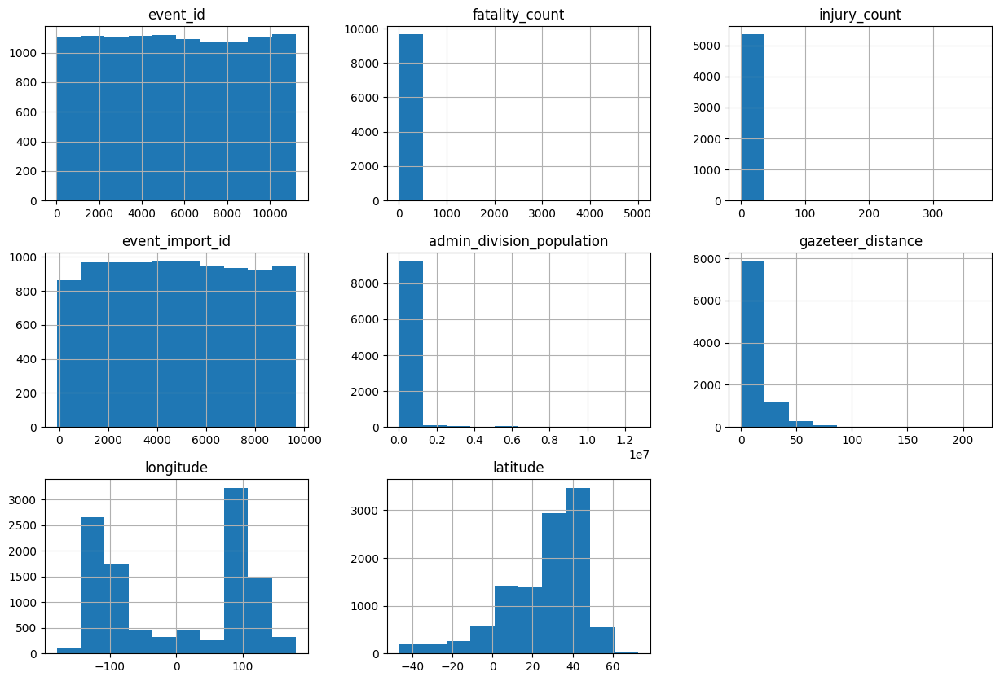

In [11]:
# Descriptive statistics, This won't provide much information about dataset we are working
print(landslide_df.describe())

# Histograms for numeric data
landslide_df.hist(figsize=(15, 10))
plt.show()

As we have a column named event_date which have data in  MM-DD-YYYY HH:MM format let's divide the column into years, month, day columns


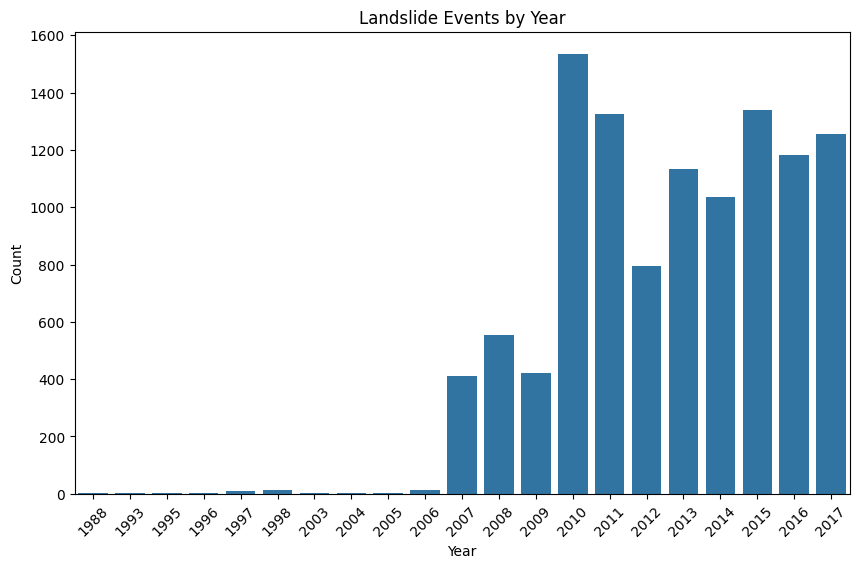

In [12]:
# Convert 'event_date' to datetime format
landslide_df['event_date'] = pd.to_datetime(landslide_df['event_date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract year, month, and day components
landslide_df['year'] = landslide_df['event_date'].dt.year
landslide_df['month'] = landslide_df['event_date'].dt.month
landslide_df['day'] = landslide_df['event_date'].dt.day

#let's plot the a bar plot showing the landslides events happened by year in the world
plt.figure(figsize=(10, 6))
sns.countplot(x='year', data=landslide_df)
plt.title('Landslide Events by Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

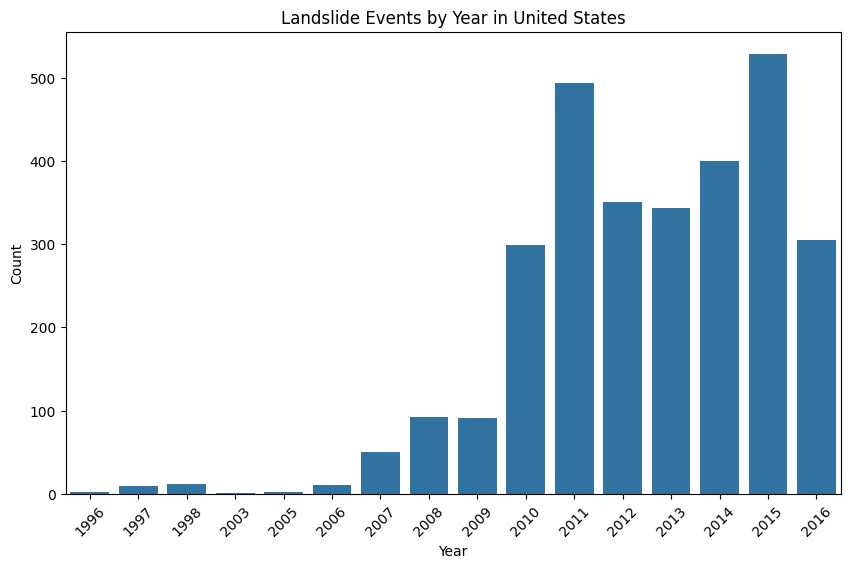

In [13]:
#let's plot the a bar plot showing the landslides events happened by year in United States
plt.figure(figsize=(10, 6))
sns.countplot(x='year', data=landslide_df[landslide_df['country_name'] == 'United States'])
plt.title('Landslide Events by Year in United States')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

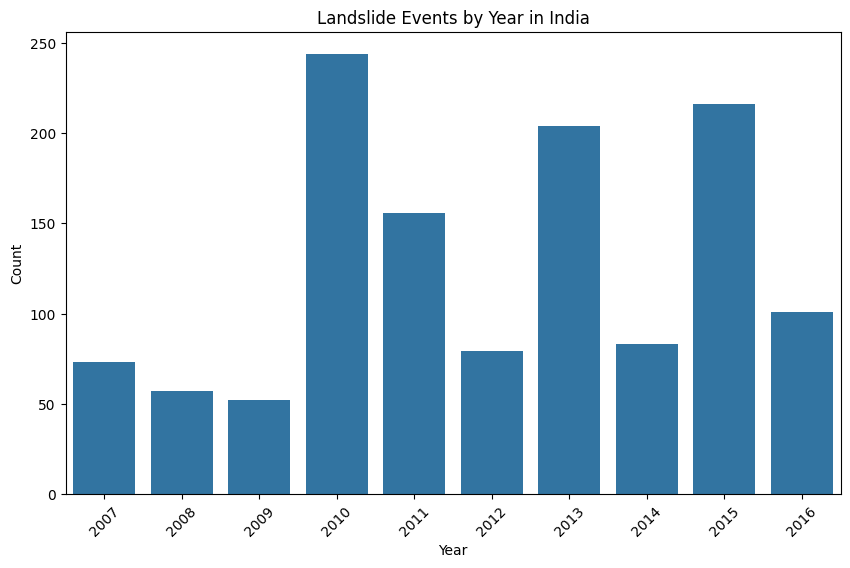

In [14]:
#let's plot the a bar plot showing the landslides events happened by year in India

plt.figure(figsize=(10, 6))
sns.countplot(x='year', data=landslide_df[landslide_df['country_name'] == 'India'])
plt.title('Landslide Events by Year in India')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

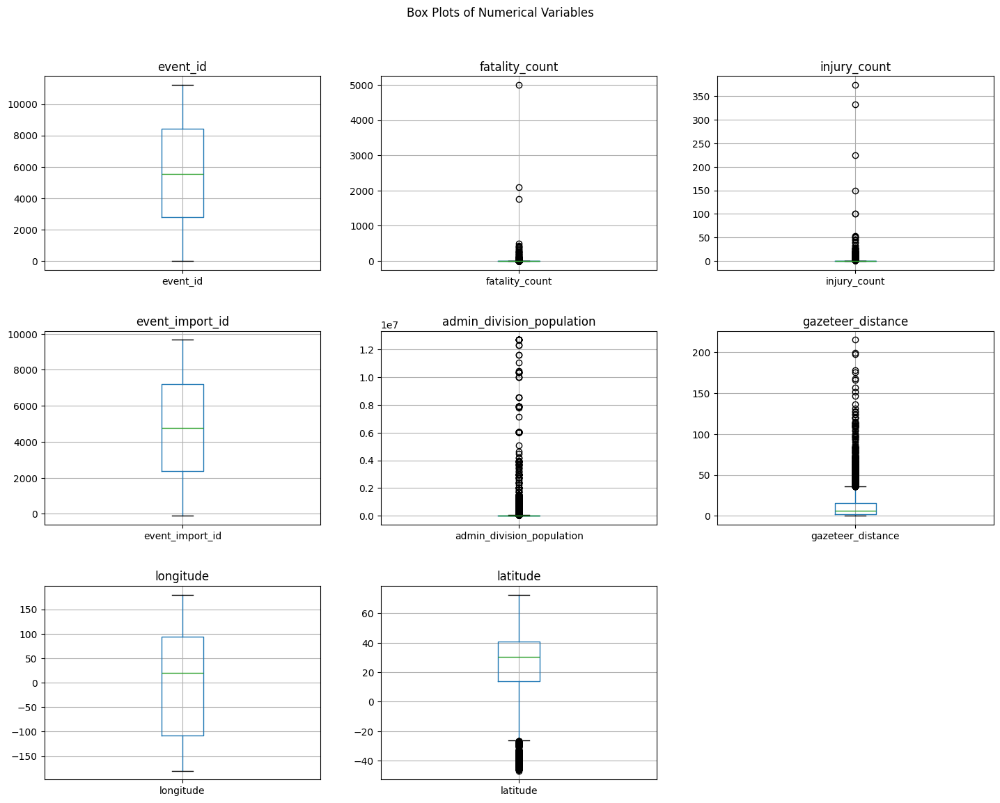

In [15]:
#as we have various attributes with numerical values lets box plot them which shows the distribution of values as per the dataset
numerical_data = landslide_df.select_dtypes(include=['float64', 'int64'])

# Define the number of plots along the x and y axis
n_cols = 3  # Number of columns in the subplot grid
n_rows = (numerical_data.shape[1] + n_cols - 1) // n_cols  # Calculate number of rows needed

# Create a figure and axes with a dynamic size based on the number of subplots
plt.figure(figsize=(n_cols * 5, n_rows * 4))  # Adjust size dynamically

# Create subplots for each numerical column
for i, column in enumerate(numerical_data.columns):
    plt.subplot(n_rows, n_cols, i + 1)  # Position each subplot in the correct location
    landslide_df.boxplot(column=[column])
    plt.title(column)

plt.suptitle('Box Plots of Numerical Variables')
plt.tight_layout(pad=3.0)  # Add padding to ensure subplots don't overlap
plt.show()

Now let's focus on the injuries and deaths due to the landslides occured, As a part of this lets create a new dataframe chopping unwanted attributes

In [16]:
storm_landslides = landslide_df[landslide_df['storm_name'].notna()]
# Summarizing the data
storm_summary = storm_landslides[['storm_name', 'landslide_size', 'fatality_count', 'injury_count']].groupby(['storm_name', 'landslide_size']).agg(
    total_events=pd.NamedAgg(column='storm_name', aggfunc='count'),
    total_fatalities=pd.NamedAgg(column='fatality_count', aggfunc='sum'),
    total_injuries=pd.NamedAgg(column='injury_count', aggfunc='sum')
).reset_index()
storm_summary

,storm_name,landslide_size,total_events,total_fatalities,total_injuries
0,0,small,1,0.0,0.0
1,1 hour of rain,medium,1,0.0,0.0
2,3 days of rain,medium,1,1.0,0.0
3,5.6 miles southeast of Neah Bay,small,1,0.0,0.0
4,Agaton,large,7,51.0,3.0
...,...,...,...,...,...
257,Wipha,very_large,1,39.0,0.0
258,and Rain,medium,1,0.0,0.0
259,cold front No. 7,medium,1,0.0,0.0
260,ex-Tropical Cyclone Debbie,small,1,0.0,0.0


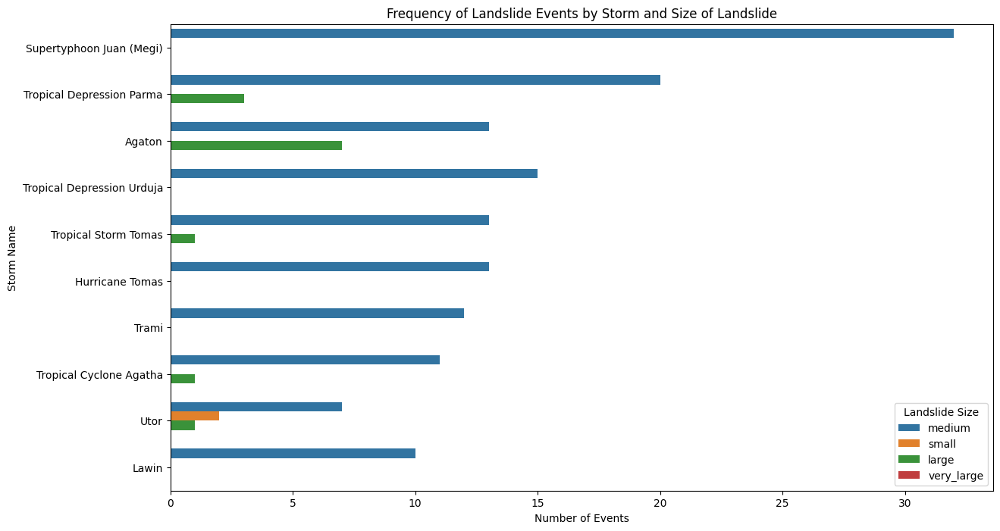

In [17]:
# Visualizing the relationship between storms and landslide size
plt.figure(figsize=(14, 8))
sns.countplot(data=storm_landslides, y='storm_name', hue='landslide_size', order=storm_landslides['storm_name'].value_counts().iloc[:10].index)
#sns.countplot(data=storm_landslides, y='storm_name', hue='landslide_size', order=storm_landslides['storm_name'].value_counts().iloc[:20].index)
plt.title('Frequency of Landslide Events by Storm and Size of Landslide')
plt.xlabel('Number of Events')
plt.ylabel('Storm Name')
plt.legend(title='Landslide Size')
plt.show()

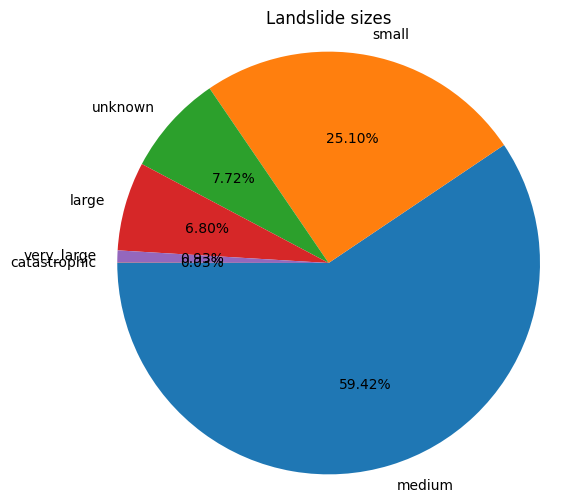

In [18]:
import matplotlib.pyplot as plt

# Assuming your dataset is stored in a DataFrame called 'df' and the attribute you're interested in is called 'attribute_name'

# Calculate the frequency of each value
value_counts = landslide_df['landslide_size'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(6, 6))  # Increase the figure size
plt.pie(value_counts, labels=value_counts.index, autopct='%1.2f%%', startangle=180, labeldistance=1.1)  # Adjust labeldistance
plt.title('Landslide sizes')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


# TIME SERIES GRAPH

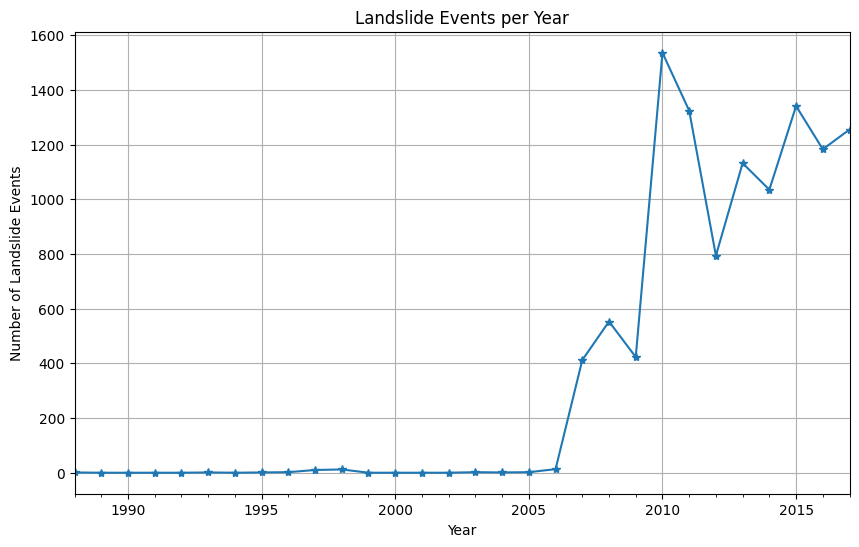

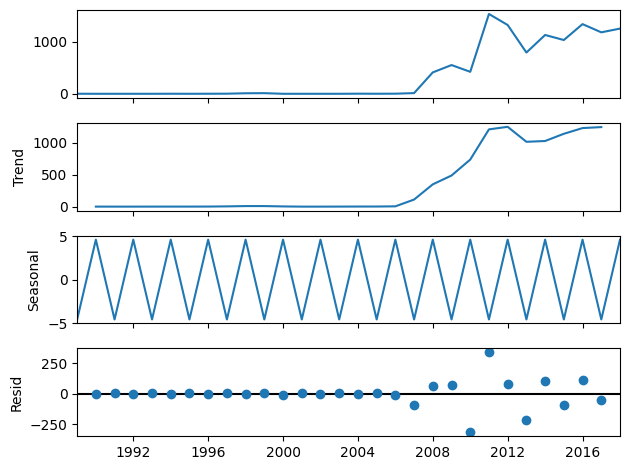

In [19]:
# Convert the 'event_date' column to datetime format
landslide_df['event_date'] = pd.to_datetime(landslide_df['event_date'], format='%m/%d/%Y %I:%M:%S %p')

# Drop any rows with NaT values in the 'event_date' column
landslide_df.dropna(subset=['event_date'], inplace=True)

# Set the 'event_date' as the index of the DataFrame
landslide_df.set_index('event_date', inplace=True)

# Resampling the data yearly and counting the number of events per year
yearly_data = landslide_df.resample('Y').size()

# Plotting the time series of landslide events
plt.figure(figsize=(10, 6))
yearly_data.plot(title='Landslide Events per Year', marker='*')
plt.xlabel('Year')
plt.ylabel('Number of Landslide Events')
plt.grid(True)
plt.show()

# Optional: Decompose the time series to observe trend, seasonal, and residual components
decomposition = seasonal_decompose(yearly_data, model='additive', period=2)  # Adjust period according to dataset
fig = decomposition.plot()
plt.show()

Creating a correlation matrix for the numerical attributes

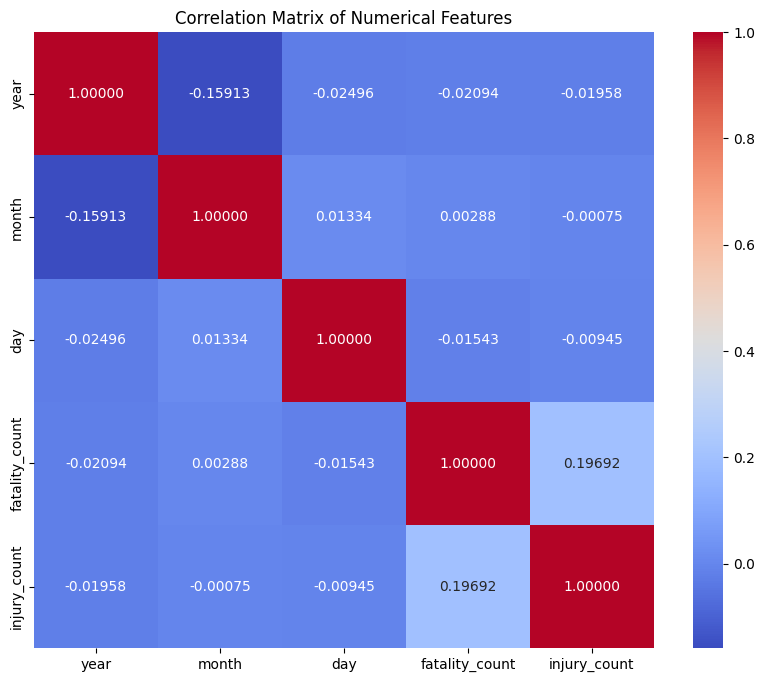

In [20]:
# Select numerical columns for correlation
numerical_columns = ['year', 'month', 'day', 'fatality_count', 'injury_count']  # Add other numerical columns as needed
numerical_df = landslide_df[numerical_columns]

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()


# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.5f', cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Features')
plt.show()

![image.png](attachment:image.png)

# LET'S VISUALIZE THE DATA MORE EFFECTIVELY

# DO YOU WANT TO SEE THE OCCURENCE OF LANDSLIDE NATURAL CALAMITIES VISUALLY ON THE MAP ??

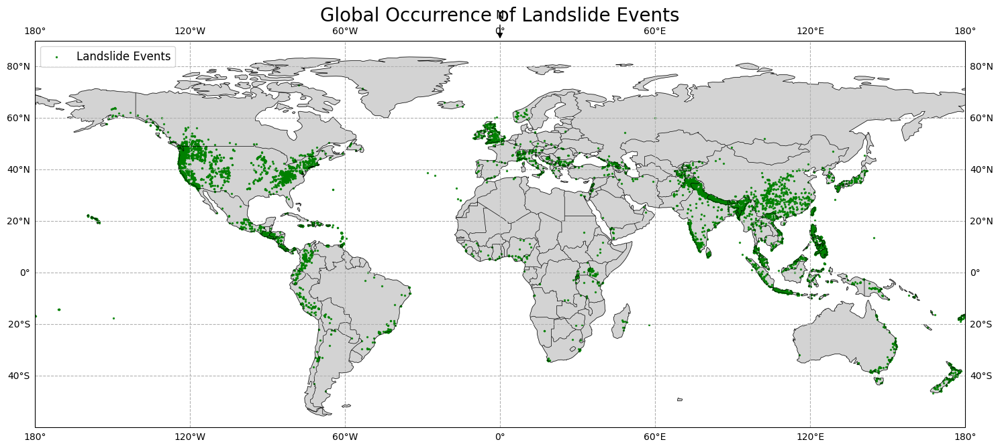

In [21]:
def landslide_visualization(landslide_df):
    """
    Visualizes the global occurrence of landslide events using a map plot.

    Parameters:
    - landslide_df (DataFrame): DataFrame containing landslide data with columns 'latitude' and 'longitude'.

    Returns:
    - None
    """

    try:
        # Create GeoDataFrame with the latitude and longitude coordinates
        global_map = gpd.GeoDataFrame(landslide_df, geometry=gpd.points_from_xy(landslide_df['longitude'], landslide_df['latitude']))

        # Create the plot
        fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
        ax.set_title('Global Occurrence of Landslide Events', fontsize=20)

        # Add map features
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=0.5)
        ax.add_feature(cfeature.LAND, color='lightgrey')

        # Plot the landslide events
        global_map.plot(ax=ax, marker='o', color='green', markersize=2, alpha=0.8, label='Landslide Events')

        # Add legend
        ax.legend(loc='upper left', fontsize=12)

        # Add compass rose
        ax.annotate('N', xy=(0.5, 1), xytext=(0.5, 1.05), xycoords='axes fraction', fontsize=12, ha='center', va='bottom',
                    arrowprops=dict(arrowstyle='-|>', color='black'))

        # Add gridlines
        ax.gridlines(draw_labels=True, linestyle='--')

        # Adjust the extent of the map
        ax.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())

        # Show the plot
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print("An error occurred:", e)

landslide_visualization(landslide_df)
#landslide_visualization(us_data)
#landslide_visualization(india_data)


In [22]:
import plotly.graph_objects as go

# Create a 3D Earth map
fig = go.Figure()

# Add a scattergeo trace
fig.add_trace(go.Scattergeo(
    lon=landslide_df['longitude'],
    lat=landslide_df['latitude'],
    mode='markers',
    marker=dict(
        size=2,
        color='darkgreen',
        opacity=0.8
    )
))

# Update layout for 3D view
fig.update_geos(
    projection_type='orthographic',
    showland=True,
    showocean=True,
    oceancolor='lightblue',
    landcolor='lightgrey',
    showcountries=True
)

# Set title
fig.update_layout(title='3D Earth Map of Landslide Events')

# Show the plot
fig.show()


# Let's plot another graph to show the density of landslide occurence to check which places on earth experienced landslides more number of times

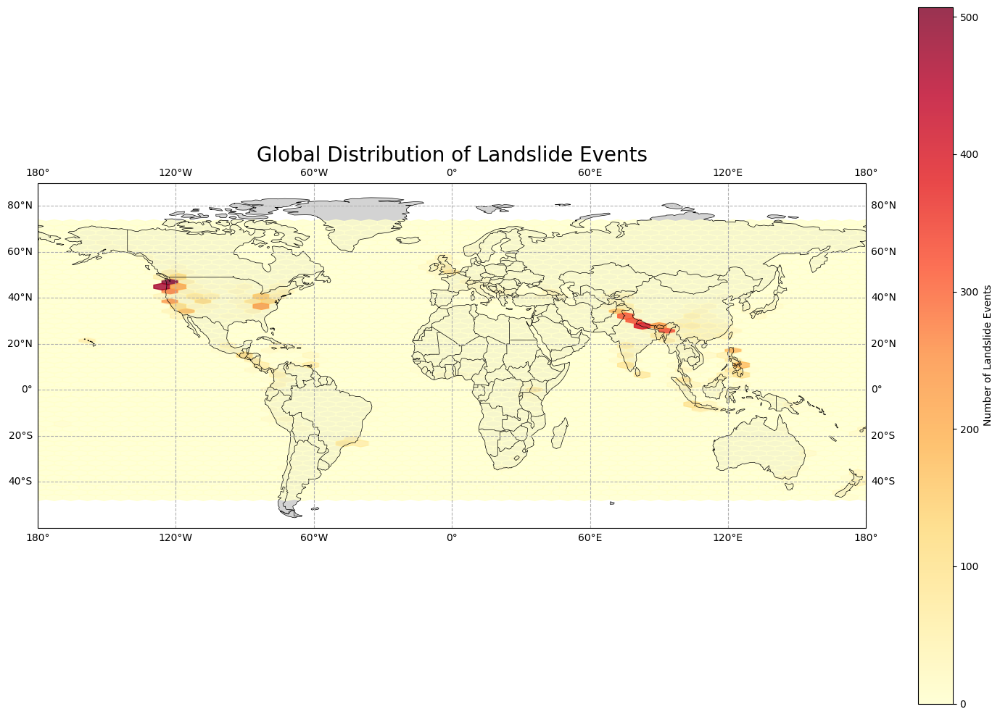

In [23]:
# Create GeoDataFrame with the latitude and longitude coordinates
global_map = gpd.GeoDataFrame(landslide_df, geometry=gpd.points_from_xy(landslide_df['longitude'], landslide_df['latitude']))

# Create the plot
fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_title('Global Distribution of Landslide Events', fontsize=20)

# Add background map
ax.add_feature(cfeature.LAND, facecolor='lightgrey')
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=0.5)

# Plot latitude and longitude using hexbin
hb = ax.hexbin(global_map['longitude'], global_map['latitude'], gridsize=50, cmap='YlOrRd', alpha=0.8)

# Add colorbar
cb = plt.colorbar(hb, ax=ax)
cb.set_label('Number of Landslide Events')

# Add gridlines with labels
ax.gridlines(draw_labels=True, linestyle='--')

# Adjust the extent of the map
ax.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())

# Show the plot
plt.tight_layout()
plt.show()


# From the above visualization we can understand that the northern part of India and Northwest and northeast part of US experienced landslides frequently. That is the reason I chose two dataframes of USA and India

# Now let's plot a 3d scatter plot graph to find which latitude and longitude range experienced majority of landslides

In [24]:
import plotly.graph_objects as go

# Create a scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=landslide_df['longitude'],
    y=landslide_df['latitude'],
    z=landslide_df.index,  # Assuming the index represents time
    mode='markers',
    marker=dict(
        size=2,
        color='green',
        opacity=0.8
    )
))

# Set axis titles
fig.update_layout(scene=dict(
                    xaxis_title='Longitude',
                    yaxis_title='Latitude',
                    zaxis_title='Time'
                    ),
                  title='3D Scatter Plot of Landslide Events')

# Show the plot
fig.show()

The density of plots is high at latitude and longitude of northeast and northwest parts of US and North India

# HYPOTHESIS 1: Frequency of landslide events over time to identify seasonal patterns in landslides occurrence.

Null Hypothesis: Occurence of landslides is independent from the seasonal patterns

I am considering the US and Indian landslide data to test the hypothesis 1 logically and statistically through some methods below
1. I am extracting the year, month, day from the event_date column from the attribute and test for the US and Indian datasets

2. As there are four seasons trend followed in US ie, Winter, Spring, Summer, Fall, I am assigning months we extracted from datasets to the seasons for US dataset

3. Same with India, As three season trend followed in India ie, Winter, Summer, Monsoon, I am assigning months to these three seasons for Indian dataset

4. To test the hypothesis visually,I will visualize the bar plot between landslide occurences and seasons

5. To test the hypothesis statistically, I will perform the chi squared test to find the distribution across the seasons


In [25]:
us_data['event_date'] = pd.to_datetime(us_data['event_date'], format='%m/%d/%Y %I:%M:%S %p')
#us_data['event_date'] = pd.to_datetime(us_data['event_date'], errors='coerce')
us_data['year'] = us_data['event_date'].dt.year
us_data['month'] = us_data['event_date'].dt.month
us_data['day'] = us_data['event_date'].dt.day

india_data['event_date'] = pd.to_datetime(india_data['event_date'], format='%m/%d/%Y %I:%M:%S %p')
india_data['year'] = india_data['event_date'].dt.year
india_data['month'] = india_data['event_date'].dt.month
india_data['day'] = india_data['event_date'].dt.day

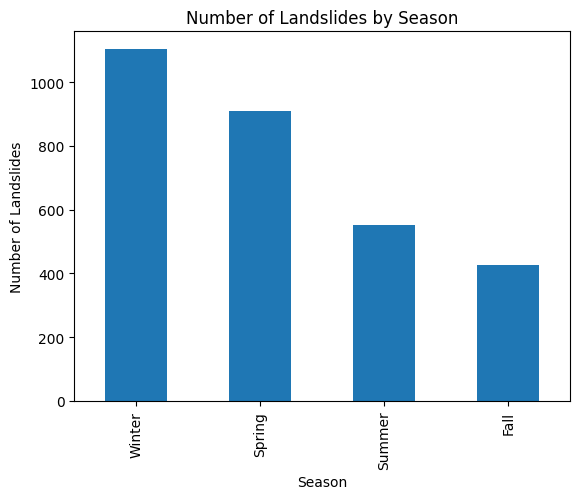

In [26]:
# Extracting the month from the 'event_date' column to find the season
# This seasoning is done as per USA seasonal patterns
month_to_season = {
    1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'
}
us_data['season'] = us_data['month'].map(month_to_season)

# Count the number of landslides in each season
landslide_season_counts = us_data['season'].value_counts()

# Plot the distribution of landslides by season
landslide_season_counts.plot(kind='bar')
plt.title('Number of Landslides by Season')
plt.xlabel('Season')
plt.ylabel('Number of Landslides')
plt.show()

In [27]:
# Perform a Chi-squared test for US data to see if the distribution across seasons is uniform
observed_frequencies = landslide_season_counts.values
expected_frequencies = [len(us_data) / 4] * 4  # Expect uniform distribution over 4 seasons
chi2, p_value = chi2_contingency([observed_frequencies, expected_frequencies])[0:2]

# Output the results
print(f"Observed Frequencies: {observed_frequencies}")
print(f"Expected Frequencies (Uniform Distribution): {expected_frequencies}")
print(f"Chi-squared Test Statistic: {chi2}")
print(f"P-value: {p_value}")

Observed Frequencies: [1104  909  553  426]
Expected Frequencies (Uniform Distribution): [748.0, 748.0, 748.0, 748.0]
Chi-squared Test Statistic: 201.61967947619564
P-value: 1.884463061771584e-43


From the above bar plot, we can observe that the landslide occurence is high in winter season for US data,

check the links below to see precipitation map for northwest states (because the density map of occurence of landslides is high in northwest states of USA), it usually ranges from 100-200 inch scale which is high in feb-march months which comes under winter season in US

https://gisgeography.com/us-precipitation-map/

https://www.cpc.ncep.noaa.gov/products/assessments/assess_99/name.html

Coming to the results of chi squared test, the observed frequencies varies from uniform distribution and P value is very small which is close to zero.The p-value generally indicates the probability of observing such a difference by random chance, with lower p-values suggesting a significant difference between observed and expected data.

The p-value 1.884463061771584e-43 is very small (close to zero), indicating strong evidence against the null hypothesis. Therefore, I would reject the null hypothesis and conclude that there is a significant difference between the observed and expected frequencies. So statistically, we can prove that the null hypothesis we considered is wrong concluding there is a significant relationship between the seasonal trend and occurence of landslides.

refer to the below article to learn more about the chi squared test

https://jahanzaib5.github.io/Chi-square-test-HTML/

With the visual, logical and statistical proofs, I proved my null hypothesis as false

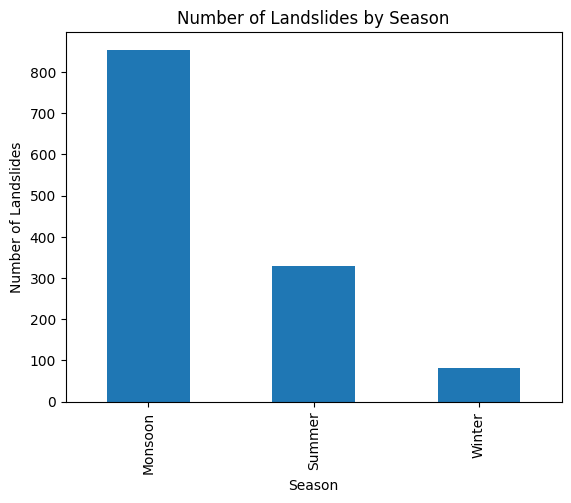

In [28]:
# Extracting the month from the 'event_date' column to find the season
# This seasoning is done as per Indian time zones
month_to_season = {
    1: 'Winter', 2: 'Winter',
    3: 'Summer', 4: 'Summer', 5: 'Summer',
    6: 'Summer', 7: 'Monsoon', 8: 'Monsoon',
    9: 'Monsoon', 10: 'Monsoon', 11: 'Winter', 12: 'Winter'
}
india_data['season'] = india_data['month'].map(month_to_season)

# Count the number of landslides in each season
landslide_season_counts = india_data['season'].value_counts()



# Plot the distribution of landslides by season
landslide_season_counts.plot(kind='bar')
plt.title('Number of Landslides by Season')
plt.xlabel('Season')
plt.ylabel('Number of Landslides')
plt.show()

In [29]:
# Perform a Chi-squared test to see if the distribution across seasons is uniform
observed_frequencies = landslide_season_counts.values
expected_frequencies = [len(india_data) / 3] * 3  # Expect uniform distribution over 4 seasons
chi2, p_value = chi2_contingency([observed_frequencies, expected_frequencies])[0:2]

# Output the results
print(f"Observed Frequencies: {observed_frequencies}")
print(f"Expected Frequencies (Uniform Distribution): {expected_frequencies}")
print(f"Chi-squared Test Statistic: {chi2}")
print(f"P-value: {p_value}")

Observed Frequencies: [854 330  81]
Expected Frequencies (Uniform Distribution): [421.6666666666667, 421.6666666666667, 421.6666666666667]
Chi-squared Test Statistic: 388.57619938039966
P-value: 4.1855294793172465e-85


From the above bar plot, we can observe that the landslide occurence is high in monsoon season (july, August, Sept) for Indian data,

check the links below to see precipitation map for northern states of India

https://www.worlddata.info/asia/india/climate-northern.php

The below snip is captured from the above hyperlink about Indian climate data
![image.png](attachment:image.png)



Coming to the results of chi squared test, the observed frequencies varies from uniform distribution and P value is very small which is close to zero.The p-value generally indicates the probability of observing such a difference by random chance, with lower p-values suggesting a significant difference between observed and expected data.

The p-value 4.185529479317247e-85 is very small (close to zero), indicating strong evidence against the null hypothesis. Therefore, I would reject the null hypothesis and conclude that there is a significant difference between the observed and expected frequencies. So statistically, we can prove that the null hypothesis we considered is wrong concluding there is a significant relationship between the seasonal trend and occurence of landslides.

refer to the below article to learn more about the chi squared test

https://jahanzaib5.github.io/Chi-square-test-HTML/

With the visual, logical and statistical proofs, I proved my null hypothesis as false